# Proyecto Final procesamiento digital de señales [PDS]
## Sebastián Bolívar Vanegas. CC: 1017268527

# Seccion 1:
## Aplicacion de filtro FIR en reduccion de de ruido impulsivo.
### La idea de esta seccion es simular un señal que tenga presente ruido impulsivo en su contenido, para posteriormente diseñar un filtro que ayude a reducir en gran manera la presencia de estas frecuencias que presentan el ruido mensionado.

### Para llevar a cabo este proceso es recomendable graficar la señal para poder determinar en que rango de frecuencias se encuentra el ruido impulsivo, luego de tener conciencia de donde se presenta el ruido lo siguiente es dieñar el filtro con una frecuencia de corte adecuada para atenuar el ruido impulsivo; para poder corroborar que la señal ha sido filtrada correctamente es ideal graficar el espectro luego de pasar por el filtro para confirmar el filtrado.

In [113]:
import scipy.signal as signal 
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import firwin, lfilter
from scipy.fft import fft, fftfreq
import math
from scipy.io.wavfile import read, write 
from IPython.display import Audio
from scipy.io import wavfile


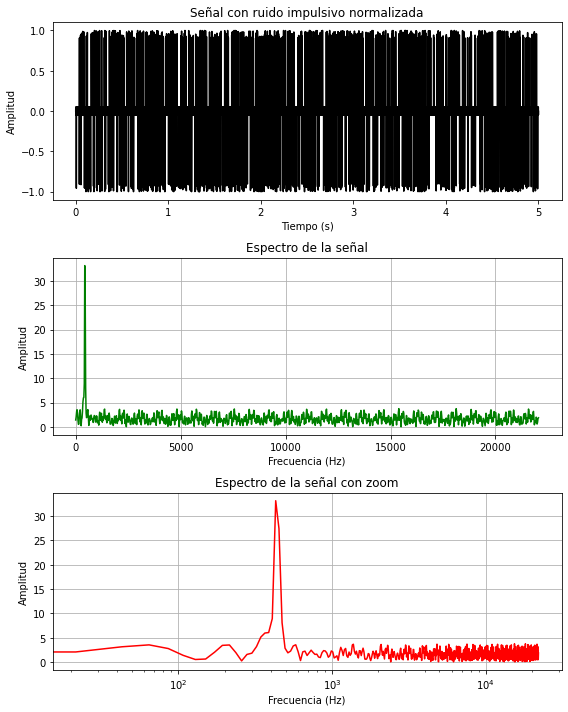

In [61]:


duration = 5.0  # Duración de la señal en segundos
sample_rate = 44100  # Frecuencia de muestreo en Hz
frequency = 440  # Frecuencia de la señal en Hz

t = np.linspace(0, duration, int(duration * sample_rate), endpoint=False)
signal = np.sin(2 * np.pi * frequency * t)

prob_impulse = 0.005  # Probabilidad de tener un pico impulsivo
amplitude = 20.0  # Amplitud del pico impulsivo

for i in range(len(signal)):
    if np.random.uniform() < prob_impulse:
        signal[i] += np.random.choice([-amplitude, amplitude])

normalized_signal = signal / np.max(np.abs(signal))

# Cálculo del espectro
window_size = 2048  # Tamaño de la ventana para la STFT
hop_length = 512  # Tamaño del salto entre ventanas
spectrogram = np.abs(np.fft.fft(normalized_signal, window_size)[:window_size//2+1])

# Escala de frecuencias correspondientes al espectro
frequencies = np.linspace(0, sample_rate/2, len(spectrogram))

# Ajustar el tamaño de la figura
plt.figure(figsize=(8, 10))

# Graficar señal en el dominio del tiempo
plt.subplot(3, 1, 1)
plt.plot(t, normalized_signal, color='black')
plt.xlabel("Tiempo (s)")
plt.ylabel("Amplitud")
plt.title("Señal con ruido impulsivo normalizada")

# Graficar espectro en el dominio de la frecuencia con zoom logarítmico
plt.subplot(3, 1, 2)
plt.plot(frequencies, spectrogram,color='green')
plt.grid()
plt.xlabel("Frecuencia (Hz)")
plt.ylabel("Amplitud")
plt.title("Espectro de la señal")
#plt.xscale('log')  # Establecer escala logarítmica en el eje x

plt.subplot(3, 1, 3)
plt.plot(frequencies, spectrogram, color='red')
plt.grid()
plt.xlabel("Frecuencia (Hz)")
plt.ylabel("Amplitud")
plt.title("Espectro de la señal con zoom")
plt.xscale('log')  # Establecer escala logarítmica en el eje x

plt.tight_layout()
plt.show()

# Diseño y aplicacion del filtro.

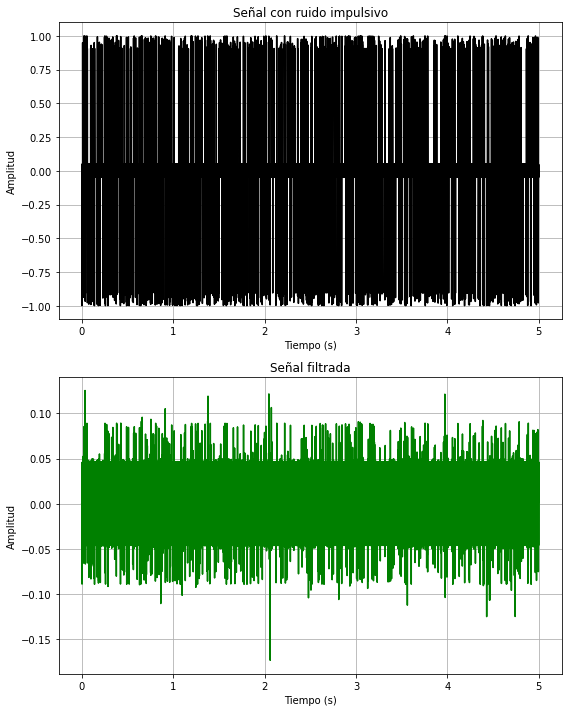

In [57]:
# Diseño del filtro FIR
order = 100  # Orden del filtro
cutoff_freq = 1000  # Frecuencia de corte del filtro en Hz
nyquist_freq = sample_rate / 2
cutoff_norm = cutoff_freq / nyquist_freq
taps = firwin(order+1, cutoff_norm)

# Filtrado de la señal
filtered_signal = lfilter(taps, [1.0], normalized_signal)


# Graficar señal original y señal filtrada
plt.figure(figsize=(8, 10))

plt.subplot(2, 1, 1)
plt.plot(t, normalized_signal, color='black')
plt.grid()
plt.xlabel("Tiempo (s)")
plt.ylabel("Amplitud")
plt.title("Señal con ruido impulsivo")

plt.subplot(2, 1, 2)
plt.plot(t, filtered_signal, color='green')
plt.grid()
plt.xlabel("Tiempo (s)")
plt.ylabel("Amplitud")
plt.title("Señal filtrada")

plt.tight_layout()
plt.show()

# Espectro antes y despues de pasar por el filtro.

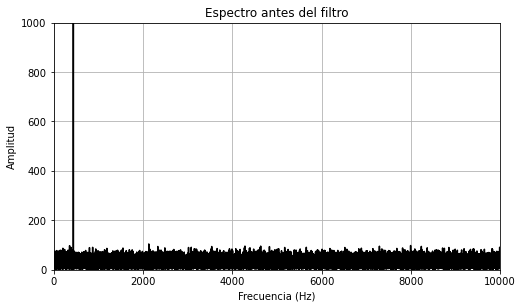

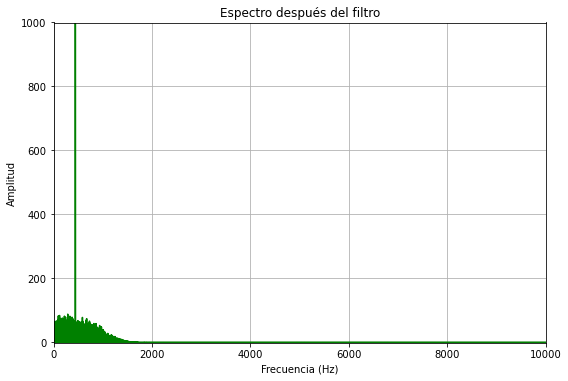

In [96]:
# Cálculo del espectro antes del filtro
spectrum_original = np.abs(fft(normalized_signal))
frequencies_original = fftfreq(len(normalized_signal), 1 / sample_rate)

# Cálculo del espectro después del filtro
spectrum_filtered = np.abs(fft(filtered_signal))
frequencies_filtered = fftfreq(len(filtered_signal), 1 / sample_rate)

# Graficar espectro antes del filtro
plt.figure(figsize=(8, 10))
plt.subplot(2, 1, 1)
plt.plot(frequencies_original, spectrum_original,color='black')
plt.grid()
plt.xlabel("Frecuencia (Hz)")
plt.ylabel("Amplitud")
plt.title("Espectro antes del filtro")
plt.xlim(0,10000)
plt.ylim(-1,1000)


# Graficar espectro después del filtro
plt.figure(figsize=(8, 10))
plt.subplot(2, 1, 2)
plt.plot(frequencies_filtered, spectrum_filtered, color='green')
plt.grid()
plt.xlabel("Frecuencia (Hz)")
plt.ylabel("Amplitud")
plt.title("Espectro después del filtro")
plt.xlim(0,10000)
plt.ylim(-1,1000)

plt.tight_layout()
plt.show()

# Analisis:
## Podemos notar en las graficas temporales que se han filtrado las frecuecnias impulsivas en un gran porcentaje, este juicio se puede corroborar en los espectros, ya que que si miramos la grafica despues de pasar por el filtro es evidente que se han atenuado las frecuencias que se encuentran por arriba de la frecuencia de corte (1000Hz)


#  Seccion 2:
## Resolucion de problema tipo parcial.



### Diseñe un filtro FIR pasa-bajas por el método de enventanado, con las siguientes condiciones:
- Frecuencia de muestreo: fs= 15kHz
- Frecuencia de corte: fc= 3kHz
- Ripple: $\delta$= 0.5%
- Ancho de banda de transición: fm= 300Hz

### Para llevar a cabo este procedimiento es fundamental encontrar el ripple en decibelios para determinar el tipo de ventana a utilizar, luego de esto se pide encontrar el orden del filtro si se desea un un N impar

In [63]:
fs = 15000 #Hz  Frecuencia de muestreo
fc = 3000 #Hz   Frecuencia de corte del filtro
ripple = 0.005 #Ripple
fm = 300 #Hz   Ancho de banda de transición

#Normalizando  fc y fm:
wc = (2*np.pi*fc)/fs   #Frecuencia de corte normalizada en radianes
wm = (2*np.pi*fm)/fs   #Ancho de banda de transición normalizada en radianes

#Pasando el Ripple a dB 
Ripple_dB= 20*math.log10(ripple)
print("wc=",wc)
print("wm=",wm)
print("Ripple_dB=",Ripple_dB)

wc= 1.2566370614359172
wm= 0.12566370614359174
Ripple_dB= -46.020599913279625


## Analisis:
### En esta parte de la seccion, se estan normalizando las frecuencias para posteriormente con ayuda del ripple en decibeles podemos  decidir que tipo de ventana se va a utilizar, en terminos de ahorrar recursos lo ideal es utilizar un ventana de hanning, pero tambien se podria utilizar una ventana de blackman lo cual nos llevaria a tener mas precesamiento computacional.

In [66]:
M = (4*fs)/fm  # Orden del filtro teniendo en cuenta la ventana Hamming
if(M%2 == 0):  #Forzamos M impar
    M = M+1
M= int(M)

print('Orden del filtro Pasa-bajas: ', M)

Orden del filtro Pasa-bajas:  201


# ¿Qué ventana sería la más apropiada (entre Rectangular, Hanning, Hamming y Blackman) y cuál sería el tamaño del filtro FIR si se desea un N impar?
## Con lo aprendido en la parte teorica podemos aplicar el metodo de enventanado con lo siguiente:
**Respuesta al Impulso:**
$$h(n) = h_i(n)\omega(n) $$
donde:
$h_i(n)$: Respuesta al impulso función sinc; 
$\omega(n)$: Respuesta impulsional de la ventana

**PASA-BAJAS:**
$$h_i(n)= \left\{ \begin{array}{lcc}
             \frac{\omega_c}{\pi } \frac{\sin (\omega_cn)}{\omega_cn} &  si  & n\neq 0\\
             \\ \frac{\omega_c}{\pi } & si & n= 0\\
             \end{array}
   \right.$$
   
**Ventana Hamming:**
$$ \omega(n) = 0.54-0.46\cos\left ( \frac{2\pi n}{N-1} \right )$$

In [73]:
# Filtro pasabajas
n = np.arange(-(M-1)/2,M/2) 
hi = (wc/np.pi)*np.sinc((wc*n)/np.pi) #Respuesta del filtro ideal
win = 0.54-0.46*np.cos((2*np.pi*np.arange(len(n))) /(M-1)) #Ventana de Hamming - Se vuelve causal
h = hi*win                  #Multiplico la respuesta ideal por la ventana
w, Hh = signal.freqz(h,1, whole=True, worN=2048) #Respuesta en frecuencia del filtro enventanado

# Si se impone una respuesta con simetría positiva y causal. Encuentre h(n). Si el tamaño del filtro resulta muy grande, encuentre  el valor de al menos los primeros 5 coeficientes, 5 coeficientes centrales y 5 coeficientes finales

In [78]:
n_coef=np.arange(0,5)

# Por simetria se tiene que los primeros 5 coeficientes son iguales a los 5 coeficientes finales.
print("Simetricamente los 5 primeros coeficientes y 5 finales son equivalentes: ")
for i in n_coef:
    hi_ = (wc/np.pi)*np.sinc((wc*i)/np.pi)
    print("hi({}) =".format(i, M-1-i), np.round(hi_,5))
    VENT_hamming= 0.54 - 0.46*(np.cos(2*np.pi*i/(M-1)))   #Recordar reemplazar la M
    print("Ventana_hammig({}) =".format(i), np.round(VENT_hamming,5))
    h_=hi_*VENT_hamming
    print("h({}) = hi({}) =".format(i, M-1-i), np.round(h_,5))
    print("\n")
    
print("Por simetría los 5 coeficiente centrales son ")    
n_coef_c=np.arange(78,81)
for i in n_coef_c:
    hi_ = (wc/np.pi)*np.sinc((wc*i)/np.pi)
    print("hi({}) =".format(i, M-1-i), np.round(hi_,5))
    whamming= 0.54 - 0.46*(np.cos(2*np.pi*i/(M-1)))   #Recordar reemplazar la M
    print("Ventana_hammig({}) =".format(i), np.round(VENT_hamming,5))
    h_=hi_*VENT_hamming
    print("h({}) = hi({}) =".format(i, M-1-i), np.round(h_,5))
    print("\n")

Simetricamente los 5 primeros coeficientes y 5 finales son equivalentes: 
hi(0) = 0.4
Ventana_hammig(0) = 0.08
h(0) = hi(200) = 0.032


hi(1) = 0.30273
Ventana_hammig(1) = 0.08023
h(1) = hi(199) = 0.02429


hi(2) = 0.09355
Ventana_hammig(2) = 0.08091
h(2) = hi(198) = 0.00757


hi(3) = -0.06237
Ventana_hammig(3) = 0.08204
h(3) = hi(197) = -0.00512


hi(4) = -0.07568
Ventana_hammig(4) = 0.08363
h(4) = hi(196) = -0.00633


Por simetría los 5 coeficiente centrales son 
hi(78) = -0.0024
Ventana_hammig(78) = 0.08363
h(78) = hi(122) = -0.0002


hi(79) = -0.00383
Ventana_hammig(79) = 0.08363
h(79) = hi(121) = -0.00032


hi(80) = -0.0
Ventana_hammig(80) = 0.08363
h(80) = hi(120) = -0.0




# Graficas:
## Respuesta al impulso.


Text(0.5, 1.0, 'Filtro FIR Respuesta al Impulso')

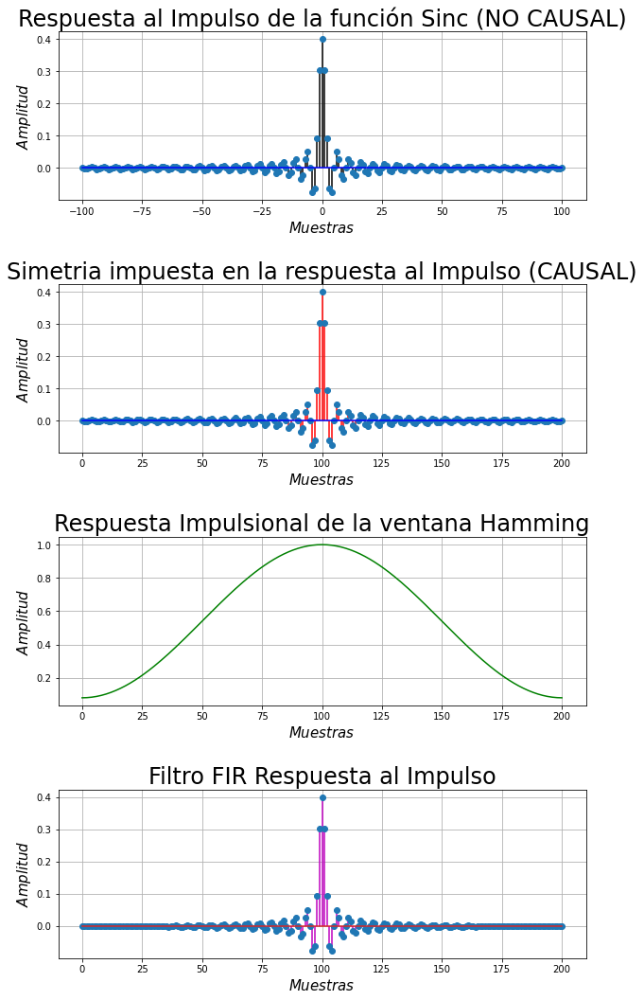

In [90]:
#Graficas
fig1, axs1 = plt.subplots(4,1)
fig1.set_size_inches((10,18))
plt.subplots_adjust(hspace=0.5)

ax=axs1[0]
ax.stem(n,hi,basefmt='b-',linefmt='k-')    # Respuesta No Causal
ax.grid()
ax.set_xlabel("$Muestras$",fontsize=15)
ax.set_ylabel("$Amplitud$",fontsize=15)
ax.set_title("Respuesta al Impulso de la función Sinc (NO CAUSAL)",fontsize=24)

n_=np.arange(0,M,1)
ax=axs1[1]
ax.stem(n_,hi,basefmt='b-',linefmt='r-')
ax.grid()
ax.set_xlabel("$Muestras$",fontsize=15)
ax.set_ylabel("$Amplitud$",fontsize=15)
ax.set_title("Simetria impuesta en la respuesta al Impulso (CAUSAL)",fontsize=24)

ax=axs1[2]
ax.plot(n_,win,color='green')
ax.grid()
ax.set_xlabel("$Muestras$",fontsize=15)
ax.set_ylabel("$Amplitud$",fontsize=15)
ax.set_title("Respuesta Impulsional de la ventana Hamming",fontsize=24)

ax=axs1[3]
ax.stem(n_,h,linefmt='m-')
ax.grid()
ax.set_xlabel("$Muestras$",fontsize=15)
ax.set_ylabel("$Amplitud$",fontsize=15)
ax.set_title("Filtro FIR Respuesta al Impulso",fontsize=24)

## Respuesta en Frecuencia:

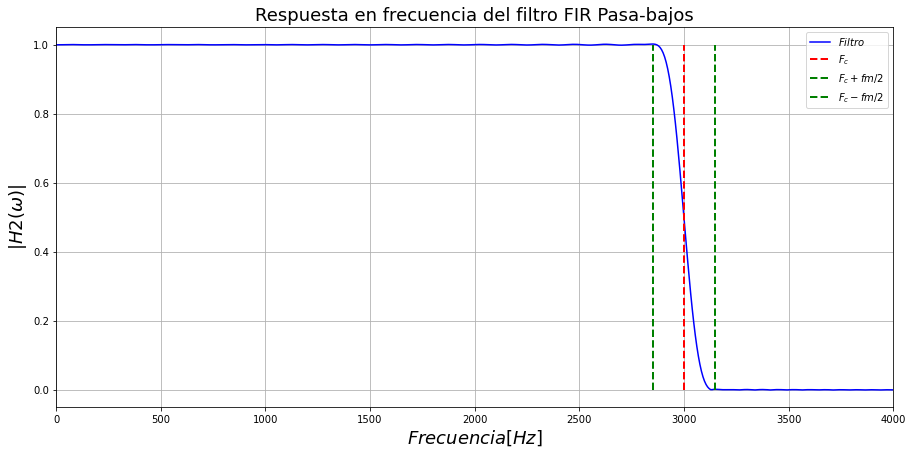

In [94]:
  #Gráfica 
plt.figure(figsize=(15,7))
plt.title('Respuesta en frecuencia del filtro FIR Pasa-bajos', fontsize=18)
plt.plot((w-np.pi)*fs/(2*np.pi), np.abs(np.fft.fftshift(Hh)), label='$Filtro$', color='blue')
plt.vlines(fc, 0, 1, color='r', lw=2, linestyle='--',label='$F_c$')
plt.vlines(fc+fm/2, 0, 1, color='g', lw=2, linestyle='--',label='$F_c+fm/2$')
plt.vlines(fc-fm/2, 0, 1, color='g', lw=2, linestyle='--',label='$F_c-fm/2$')
plt.xlim([0,4000])
plt.xlabel("$Frecuencia [Hz]$", fontsize=18)
plt.ylabel("$|H2(\omega)|$", fontsize=18)
plt.legend()
plt.grid()
plt.show()

## Analisis:
### De la respuesta en frecuencia del filtro se puede observar que  se tiene un filtro pasa bajas con frecuencia de corte en 3kHz la cual se encuentra indicada con la línea punteada de color rojo, las líneas puenteadas verdes hacen referencia  al ancho de banda de transición del filtro que es de 300Hz, ya que se utilizó una ventana Hamming se puede analizar que el Roll-Off se da de manera rápida; esto es coherente con los lóbulos secundarios de la respuesta al impulso en donde la amplitud son pequeños. En cuanto al Ripple se puede ver que no presenta muchas oscilaciones tanto en la banda pasante como en la banda atenuada y que también es coherente con el lóbulo principal de la respuesta al impulso ya no que no tiene un ancho muy notorio, por lo que se puede concluir que la ventana escogida ha sido  apropiada.

## Respuesta en Fase: 

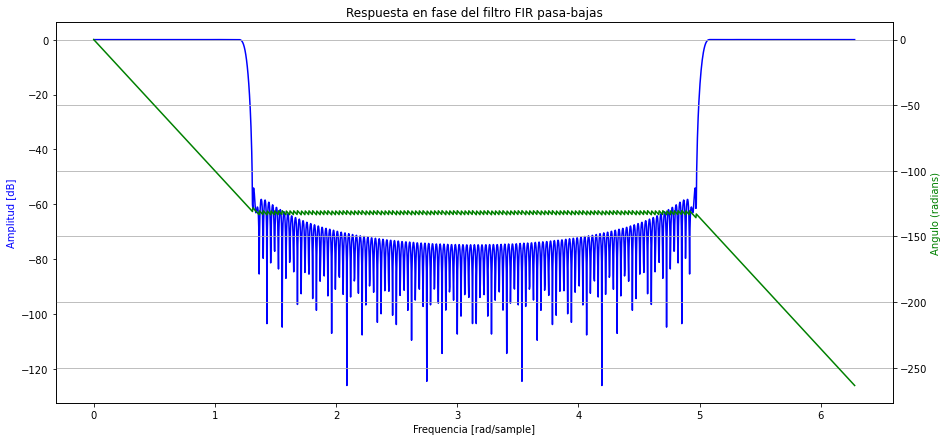

In [185]:
fig2, ax2 = plt.subplots(figsize=(15,7))
ax2.set_title('Respuesta en fase del filtro FIR pasa-bajas')
ax2.plot(w, 20 * np.log10(abs(Hh)), 'b')
ax2.set_ylabel('Amplitud [dB]', color='b')
ax2.set_xlabel('Frequencia [rad/sample]')
ax3 = ax2.twinx()
angles = np.unwrap(np.angle(Hh))
ax3.plot(w, angles, 'g')
ax3.set_ylabel('Angulo (radians)', color='g')
ax3.grid(True)
ax3.axis('tight')
plt.show()

## Analisis:
## Se puede observar que presenta una tendencia lineal, por lo que se podría decir que se impuso una fase lineal al filtro FIR mediante la respuesta al impulso. La imposición de una fase lineal puede tener diferentes propósitos en el diseño del filtro. Puede ser utilizado para corregir la distorsión de fase introducida por otros componentes del sistema, o para lograr una respuesta en frecuencia específica. En algunos casos, una fase lineal puede ser deseable para mantener la coherencia temporal de la señal de salida.


# Seccion 3:
## Filtrado en señales de Audio.


### Lo primero que se debe hacer es cargar el audio e identificar que frecuencias se desean filtrar:


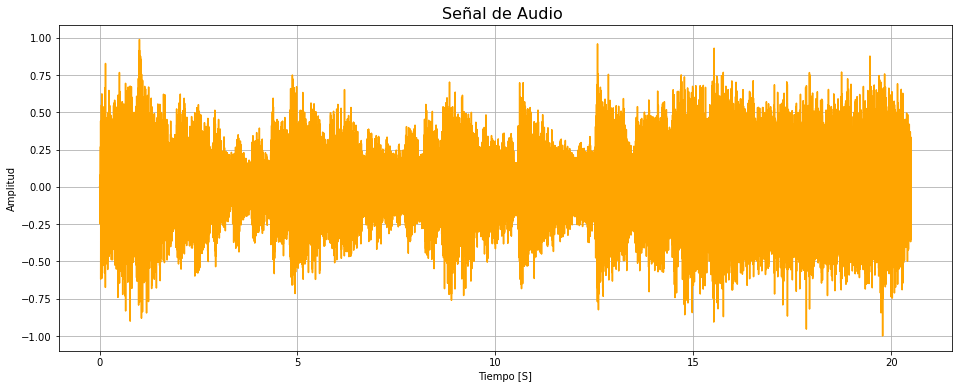

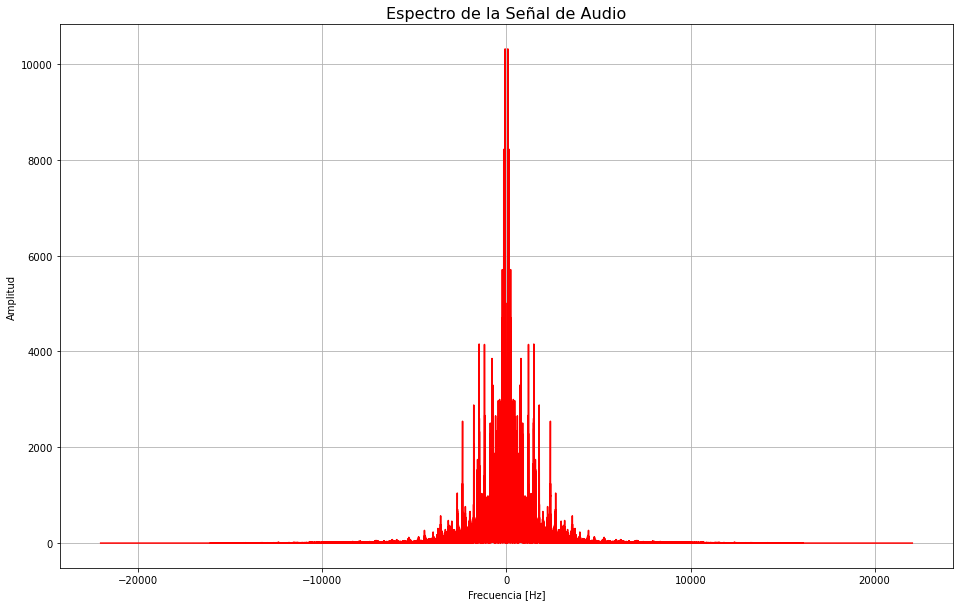

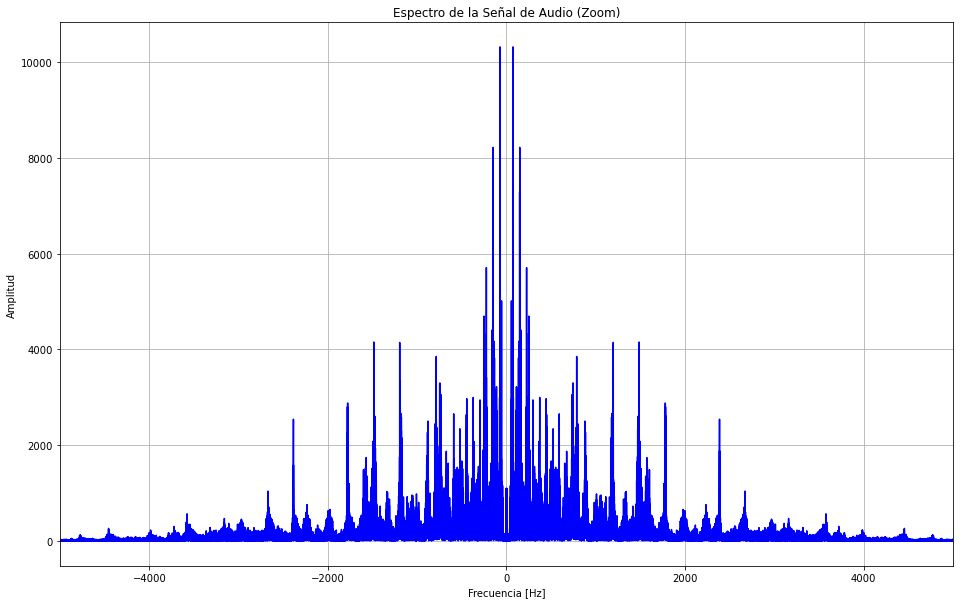

In [163]:
#Carga Audio3
f_s, x3 = read('champions.wav')

x3=x3[:,0]

#Normalizar la señal: 
x3 = x3/(float(np.max(np.abs(x3))))

#Vector de tiempo 
t3 = np.arange(0, len(x3)/fs, 1/fs)

# Make the plot
plt.figure(figsize=(16,6)) #Tamaño de la figura 
plt.plot(t3, x3, color='orange') #Elementos a graficar
plt.xlabel(r"Tiempo [S]") #Etiqueta eje X
plt.ylabel(r"Amplitud") #Etiqueta eje Y
plt.title(r"Señal de Audio ", fontsize = 16) #Titulo de la figura
plt.grid()
plt.show()

#Transformada de Fourier del audio
xfreq3 = np.fft.fft(x3)
#Vector de Frecuencias
N = np.size(xfreq3)
freq3 = np.arange(-N/2, N/2)*fs/N

#organizar el vector del espectro: 
xfreq3 = np.fft.fftshift(xfreq3)

# Make the plot
plt.figure(figsize=(16,10)) #Tamaño de la figura 
plt.plot(freq3, np.abs(xfreq3),color='red')
plt.xlabel("Frecuencia [Hz]")
plt.ylabel("Amplitud")
plt.title("Espectro de la Señal de Audio", fontsize = 16 )
plt.grid()
plt.show()


plt.figure(figsize=(16, 10))
plt.plot(freq3, np.abs(xfreq3), color='blue')
plt.xlabel("Frecuencia [Hz]")
plt.ylabel("Amplitud")
plt.title("Espectro de la Señal de Audio (Zoom)")
plt.grid()

# Establecer los límites del eje x para hacer el zoom
plt.xlim([-5000, 5000])

plt.show()

In [158]:
Audio(x3, rate= fs)

## Analisis:
### Se pueden observar que las componetes espectrales que más sobresalen, son las frecuencias que se enuentran en el rango de 0 a 2300Hz aproximadamanete; lo cual se puede corroborar en el espectro

In [173]:
def lpf(f,fs, n):
    fc = f
    #gANAICA EN dB
    AdB = 0

    #Normalizar Frecuencia: 
    Wc = (2*pi*fc)/fs
    #Normalizo el BW: 
    #bw = 2*pi*BW/fs
    
    #Tamaño del filtro
    #n = n

    #ORDEN DEL FILTRO
    M = (n-1)//2

    n = np.arange(-M, M+1)
    
    #Bw segun el orden del filtro solicitado: 
    bw = int(4/M)

    #Filtro ideal pasa bajo truncado a n muestras
    h1 =  (Wc/pi)*np.sinc(Wc*n/pi) #En teoria, las sinc toma infinitos valores. 
    #Ganancia de Filtro
    A = np.sqrt(10**(0.1*AdB))
    h1 = h1*A
    
    return h1,n

#Funcion para ventana Rectangular
def rectFun(h,n):
    rectWindow = signal.windows.boxcar(len(n))
    hw = h*rectWindow
    return hw

#Función para ventana Hann
def hanFun(h,n):
    hanWindow = signal.windows.hann(len(n))
    hw = h*hanWindow
    return hw



#Función para ventana BlackMan
def bmwFun(h,n):
    blackmanWindow = signal.windows.blackman(len(n))
    #Aplicacion de la ventana al filtro
    hw  = h*blackmanWindow
    return hw
    

## Ahora con las  funciones entregadas, la idea es variar las frecuencias de corte y mantener el orden del filtro fijo, para realizar un analisis de los resultados encontrados con diferentes ventanas:

In [181]:
pi = np.pi
#Filtro ideal
#Orden del FIltro """El orden del filtro está directamente relacionado con el tamaño"""
n = 151
#Frecuancia de Corte
fc1 = 500
fc2 = 1000
fc3 = 2000



#Crear el filtro con las caracteristicas dadas mediante la función
h1, n1 = lpf(fc1, fs, n) # fc, fs, n
h2, n2 = lpf(fc2, fs, n) # fc, fs, n
h3, n3 = lpf(fc3, fs, n) # fc, fs, n





#--------------------------------


#--------------------------------

#Filtro + ventanas segunj función
lpfRectW = rectFun(h1,n1)
lpfHanW  =  hanFun(h2,n2)
lpfBMW   =  bmwFun(h3,n3)

#Audio1 filtrado para cada tipo de ventana
y31 = signal.lfilter(lpfRectW, 1,x3)   #Rectangular con Frecuenncia de corte 1
y32 = signal.lfilter(lpfHanW, 1, x3)   # hanning con frecuencia de corte 2
y33 = signal.lfilter(lpfBMW,  1, x3)   # Blackman con frecuencia de corte 4



#FFT de la señal filtrada
y31f = np.fft.fft(y31)
y32f = np.fft.fft(y32)
y33f = np.fft.fft(y33)


#organizar el vector del espectro: 
y31f = np.fft.fftshift(y31f)
y32f = np.fft.fftshift(y32f)
y33f = np.fft.fftshift(y33f)


N = np.size(xfreq3)
freq3 = np.arange(-N/2, N/2)*fs/N



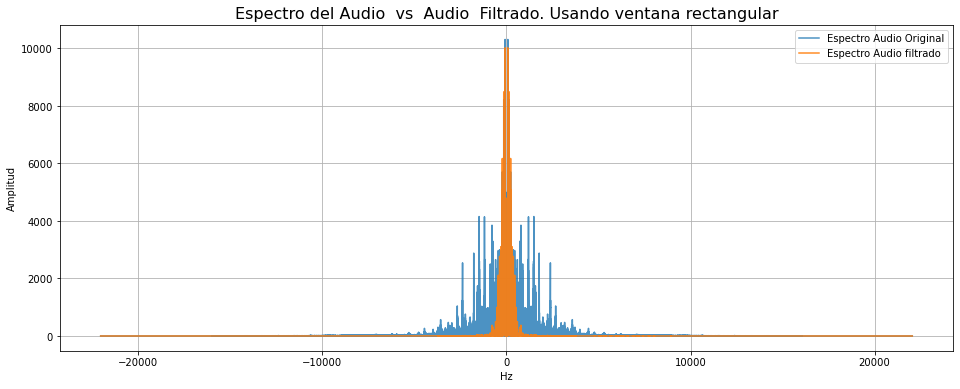

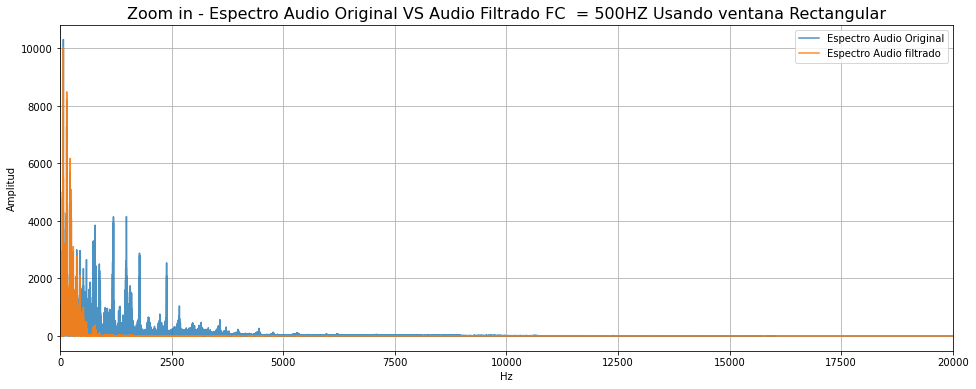

In [188]:
# Make the plot
plt.figure(figsize=(16,6)) #Tamaño de la figura 
plt.plot(freq3, np.abs(xfreq3), alpha = 0.8, label='Espectro Audio Original')
plt.xlabel(r"Hz") #Etiqueta eje X
plt.ylabel(r"Amplitud") #Etiqueta eje Y
plt.title(r"Espectro del Audio  vs  Audio  Filtrado. Usando ventana rectangular", fontsize = 16) #Titulo de la figura
plt.plot(freq3, np.abs(y31f), alpha = 0.9, label='Espectro Audio filtrado')
plt.grid()
plt.legend()
plt.show()

"""Dado el tamaño del espectro se hace un zoom alrededor de la frecuencia de
corte para visualizar mejor el efecto del filtro- Además aprovechando la simetria del espectro"""
# Make the plot
plt.figure(figsize=(16,6)) #Tamaño de la figura 
plt.plot(freq3, np.abs(xfreq3), alpha = 0.8, label='Espectro Audio Original')
plt.xlabel(r"Hz") #Etiqueta eje X
plt.ylabel(r"Amplitud") #Etiqueta eje Y
plt.title(r"Zoom in - Espectro Audio Original VS Audio Filtrado FC  = " +str(fc1)+"HZ Usando ventana Rectangular", fontsize = 16) #Titulo de la figura
plt.xlim([0, 20000])  #Limite del eje x para hacer un zoom  de 0 a una freq deseada
plt.plot(freq3, np.abs(y31f), alpha = 0.9, label='Espectro Audio filtrado')
plt.grid()
plt.legend()
plt.show()

#Reproducir audio 2 Filtrado Rect: 
Audio(y31, rate= fs)

## Para este tipo de caso que corresponde a una frecuencia de corte de 500Hz y una ventana rectangular se nota que se han filtrado una gran cantidad de componentes frecuenciales, sin embargo se logra reconocer el audio, esto significa que no se ha atenuado tanto el audio como para perder nocion del mismo.

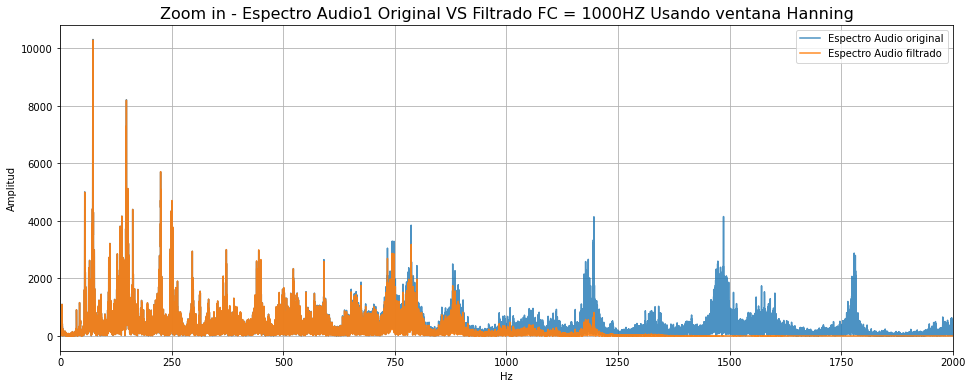

In [187]:
"""Dado el tamaño del espectro se hace un zoom alrededor de la frecuencia de
corte para visualizar mejor el efecto del filtro- Además aprovechando la simetria del espectro"""
# Make the plot
plt.figure(figsize=(16,6)) #Tamaño de la figura 
plt.plot(freq3, np.abs(xfreq3), alpha = 0.8, label='Espectro Audio original')
plt.xlabel(r"Hz") #Etiqueta eje X
plt.ylabel(r"Amplitud") #Etiqueta eje Y
plt.title(r"Zoom in - Espectro Audio1 Original VS Filtrado FC = " +str(fc2)+"HZ Usando ventana Hanning", fontsize = 16) #Titulo de la figura
plt.xlim([0, 2000])  #Limite del eje x para hacer un zoom  de 0 a una freq deseada
plt.plot(freq3, np.abs(y32f), alpha = 0.9, label='Espectro Audio filtrado')
plt.grid()
plt.legend()
plt.show()

#Reproducir audio 3 Filtrado Hann: 
Audio(y32, rate= fs)

## En este caso se esta usando una frecuencia de corte mayor, por lo que se estan filtrando  menos componentes frecuenciales que en el caso anterior, pero en este caso en especifico se esta utilizando una ventana de hanning. El resultado reflejado en el audio logra una atenuacion similar al caso anterior.

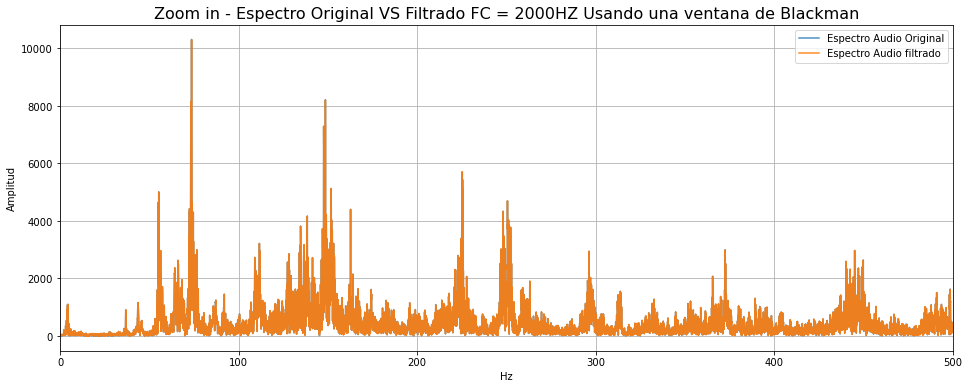

In [186]:
"""Dado el tamaño del espectro se hace un zoom alrededor de la frecuencia de
corte para visualizar mejor el efecto del filtro- Además aprovechando la simetria del espectro"""
# Make the plot
plt.figure(figsize=(16,6)) #Tamaño de la figura 
plt.plot(freq3, np.abs(xfreq3), alpha = 0.8, label='Espectro Audio Original')
plt.xlabel(r"Hz") #Etiqueta eje X
plt.ylabel(r"Amplitud") #Etiqueta eje Y
plt.title(r"Zoom in - Espectro Original VS Filtrado FC = " +str(fc3)+ "HZ Usando una ventana de Blackman", fontsize = 16) #Titulo de la figura
plt.xlim([0, 500])  #Limite del eje x para hacer un zoom  de 0 a una freq deseada
plt.plot(freq3, np.abs(y33f), alpha = 0.9, label='Espectro Audio filtrado')
plt.grid()
plt.legend()
plt.show()
#Reproducir audio 3 Filtrado HaM: 
Audio(y32, rate= fs)

### En este caso Se estan filtrando las frecuencias que se encuentran por encima de 2KHz , lo cual serian muy pocas componentes frecuenciales que representan al audio, asi mismo se esta empleando una ventana de Blackman, la cual nos genera una atenuacion considerable en el audio.

## Analisis:
### La idea de esta seccion se basa en adquirir una conciencia respecto al diseño de filtros que se basa en un conjunto de parametros bien definidos enfocados a un objetivo clave, el cual es ¿Qúe se desea filtrar y qué no? Para ello hay que tener claridad de que ventajas y desventajas nos proporciona una ventana respecto a otra y en que influye el orden del filtro. En general hay que tener un dominio de todos los parametros y sus impactos para completar correctamente el filtrado deseado.

# CONCLUSIONES:
### * La generación de la señal con ruido impulsivo se basa en la adición aleatoria de picos impulsivos a una señal senoidal pura, utilizando una probabilidad predefinida y una amplitud determinada.

### * El filtro FIR es eficaz para reducir el ruido impulsivo en una señal. Al aplicar el filtro, podemos observar una notable disminución en la presencia del ruido impulsivo, lo que mejora la calidad de la señal.

### * El diseño adecuado del filtro es crucial. La elección del orden del filtro y la frecuencia de corte influyen en la eficacia del filtrado. Es necesario ajustar estos parámetros según las características específicas del ruido impulsivo y la señal de interés para lograr una reducción óptima del ruido.

### * El diseño de filtros FIR por enventanado ofrece flexibilidad en la elección de la ventana utilizada, lo que permite adaptar el filtro a diferentes requisitos de atenuación, ancho de banda y respuesta transitoria.

### * Los filtros FIR diseñados mediante el método de enventanado son lineales y de fase lineal, lo que los hace adecuados para aplicaciones en las que la distorsión de fase es crítica, como el procesamiento de señales de audio.

### * El metodo de enventanado permite adaptar las características del filtro a las necesidades específicas de la aplicación, ofreciendo una combinación de resolución en frecuencia, atenuación y distorsión de fase adecuadas. La elección adecuada de la ventana es fundamental para lograr los resultados deseados en términos de respuesta en frecuencia y atenuación de frecuencias no deseadas.

### * Es recomendable evaluar y comparar las respuestas en frecuencia de los diferentes filtros resultantes para seleccionar la combinación óptima de tipo de ventana y frecuencias de corte. Esto permitirá lograr los mejores resultados en términos de atenuación del ruido, preservación de las características de la señal y eficiencia computacional.

### * La frecuencia de corte del filtro determina qué componentes de frecuencia se atenuarán. Al variar las frecuencias de corte, podemos adaptar el filtro para enfocarse en diferentes rangos de frecuencia y eliminar selectivamente las componentes no deseadas. Es importante elegir las frecuencias de corte de acuerdo con las características específicas de la señal de audio y el ruido presente.